# Objective

Histogram equalization

In [210]:
#Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Colors separation and reconstruction

## (a) Use an existing library to separate the three channels of your RGB image and show each of them separately.

In [211]:
from numpy import ndarray, uint8

def separate_and_display(imageName: str):
    """Display the R,G,B channels of an image"""
    image = cv2.imread(f'./in/{imageName}') 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    r,g,b = cv2.split(image)

    fig, (ax1, ax2) = plt.subplots(2, 3, figsize=(15,9))
    fig.suptitle(f'Image {imageName} separated into three channels', fontweight='bold')

    ax1[0].set_axis_off()
    ax1[2].set_axis_off()

    ax1[1].imshow(image, cmap='gray')
    ax1[1].set_title('Original image')
    ax1[1].set_axis_off()

    ax2[0].imshow(r, cmap='Reds', vmin=0, vmax=255)
    ax2[0].set_title('Red channel')

    ax2[1].imshow(g, cmap='Greens', vmin=0, vmax=255)
    ax2[1].set_title('Green channel')

    ax2[2].imshow(b, cmap='Blues', vmin=0, vmax=255)
    ax2[2].set_title('Blue channel')

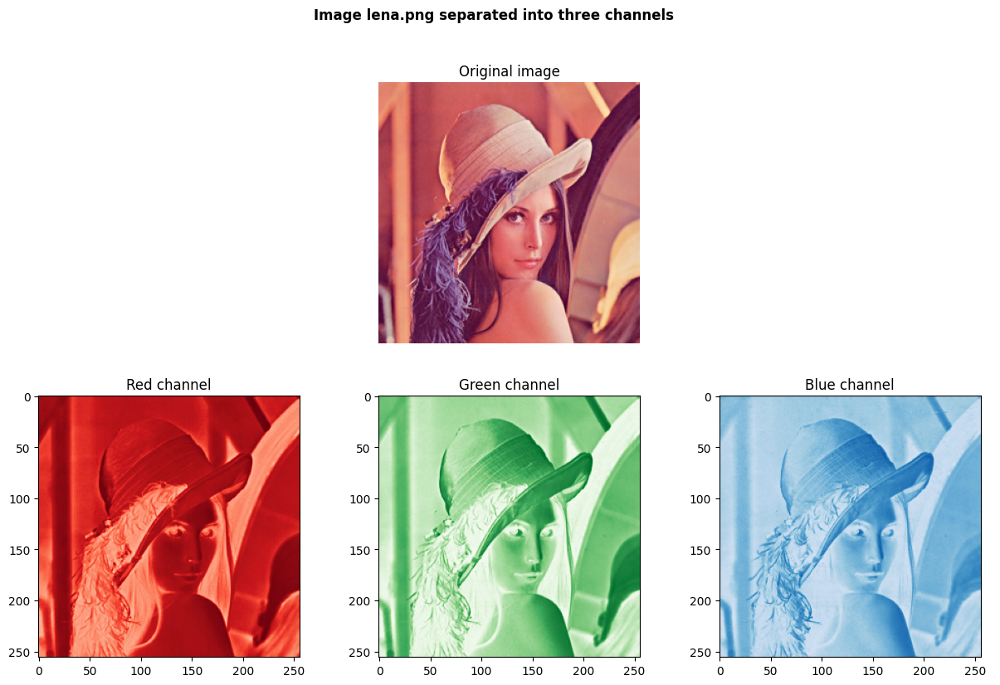

In [212]:
separate_and_display('lena.png')

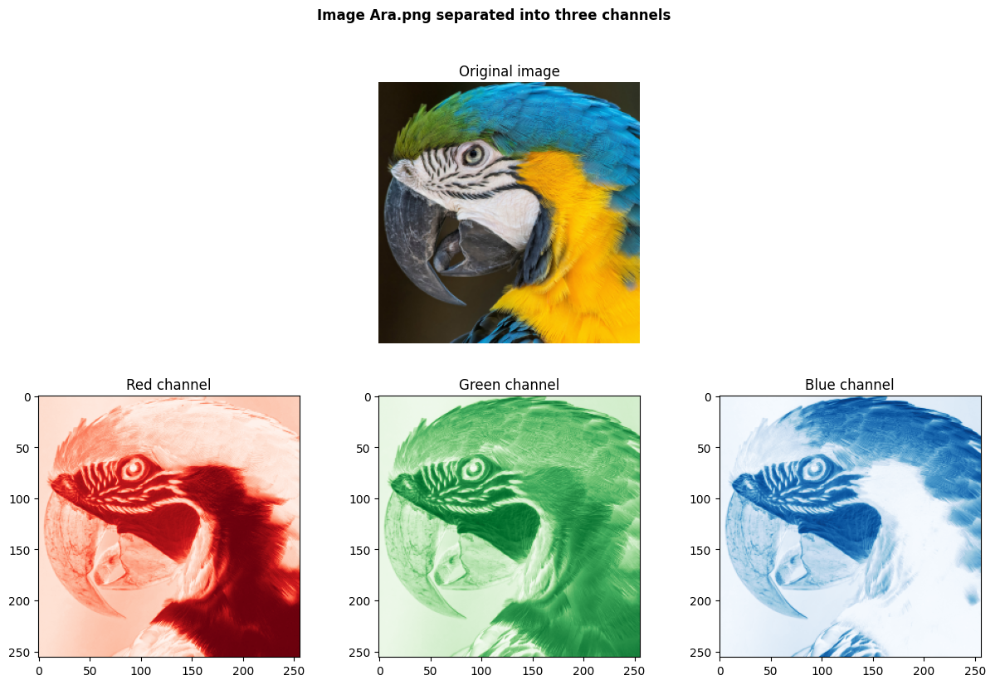

In [213]:
separate_and_display('Ara.png')

## (b) Write your own algorithm to separate an RGB image into the three channels of the HSL color space (H, S, L). See https://www.rapidtables.com/convert/color/rgb-to-hsl.html

In [214]:
def image_rgb_to_hsl(imageName: str):
    """Display the R,G,B channels of an image"""
    image = cv2.imread(f'./in/{imageName}') 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    shape = image.shape
    hslImage = np.zeros(shape, dtype=np.float32)
    (x,y,z) = shape
    for i in range(x):
        for j in range(y):
            hslImage[i,j] = pixel_rgb_to_hsl(*image[i,j])
            print(hslImage[i,j])

    print(image[0,:2])
    print(hslImage[0,:2])

    return hslImage

def pixel_rgb_to_hsl(r: float, g: float, b: float):
    """Transform a RGB pixel into a HSL one given the HSL values"""
    #Calculate meta-values
    print(f"rgb = ({r},{g},{b})")
    r = r/255
    g = g/255
    b = b/255

    rgb = [r,g,b]

    Cmax = np.max(rgb)
    Cmin = np.min(rgb)
    delta = Cmax - Cmin
    print(f"CM, Cm, delta = ({Cmax},{Cmin},{delta})")

    #Calculate H
    if delta == 0:
        h = 0
    elif Cmax == r:
        h = 60.0 * (((g-b)/delta) % 6)
    elif Cmax == g:
        h = 60.0 * (((b-r)/delta) + 2.0)
    else:
        h = 60.0 * (((r-g)/delta) + 4.0)
    print(f"h = {h}")

    #Calculate L
    l = (Cmax + Cmin) / 2

    #Calculate S
    s = 0 if delta == 0 else (delta/(1-np.abs(2*l-1)))

    return (h,s,l)

In [215]:
hslImage = image_rgb_to_hsl('lena.png')


rgb = (226,137,126)
CM, Cm, delta = (0.8862745098039215,0.49411764705882355,0.392156862745098)
h = 6.599999999999994
[6.6       0.6329114 0.6901961]
rgb = (223,137,130)
CM, Cm, delta = (0.8745098039215686,0.5098039215686274,0.3647058823529412)
h = 4.516129032258067
[4.516129   0.5923567  0.69215685]
rgb = (226,134,119)
CM, Cm, delta = (0.8862745098039215,0.4666666666666667,0.41960784313725485)
h = 8.411214953271031
[8.411215  0.6484848 0.6764706]
rgb = (228,136,123)
CM, Cm, delta = (0.8941176470588236,0.4823529411764706,0.411764705882353)
h = 7.428571428571425
[7.428571  0.6603774 0.6882353]
rgb = (226,138,124)
CM, Cm, delta = (0.8862745098039215,0.48627450980392156,0.39999999999999997)
h = 8.235294117647054
[8.235294  0.6375    0.6862745]
rgb = (226,134,121)
CM, Cm, delta = (0.8862745098039215,0.4745098039215686,0.4117647058823529)
h = 7.428571428571435
[7.428571   0.6441718  0.68039215]
rgb = (224,135,115)
CM, Cm, delta = (0.8784313725490196,0.45098039215686275,0.42745098039215684)
h